In [15]:
import re
import asyncio
import json
from typing import List
import httpx
from parsel import Selector
import pandas as pd
import ast
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor

In [3]:
# Due to Zillow blocking scraping on certain pages, searches were manually done on zillow.com and HTML source
# code downloaded to zillowhtml.txt. This section finds each property URL in the HTML and outputs it to zillow output.txt

def find_urls_with_string(html_code, target_string):
    url_pattern = r'"(https?://[^"]+)"'
    urls = re.findall(url_pattern, html_code)
    matching_urls = [url for url in urls if target_string in url]
    
    return matching_urls

with open('zillowhtml.txt','r') as file:
    html_code = file.read().replace('\n','')

target_string = "https://www.zillow.com/homedetails/"
matching_urls = find_urls_with_string(html_code, target_string)
thelist = sorted(list(set(matching_urls)))
print(len(thelist))

with open('zillow output.txt','w') as file:
    for line in thelist:
        file.write(f'{line}\n')

61


In [4]:
# using code found at https://scrapfly.io/blog/how-to-scrape-zillow/ to scrape the properties in this list
# and download all the information with each of these properties to zillow scraped properties HTML.txt. Using
# async to scrape each individual page, as typical webscraping techniques were either getting blocked by zillow
# or not populating when using beautiful soup due to possible caching issues

headers={
        "accept-language": "en-US,en;q=0.9",
        "user-agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/96.0.4664.110 Safari/537.36",
        "accept": "text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8",
        "accept-language": "en-US;en;q=0.9",
        "accept-encoding": "gzip, deflate, br",
    }

client = httpx.AsyncClient(
    http2=True,
    headers=headers,
)

async def scrape_properties(urls: List[str]):
    to_scrape = [client.get(url) for url in urls]
    results = []
    for response in asyncio.as_completed(to_scrape):
        response = await response
        assert response.status_code == 200, "request has been blocked"
        selector = Selector(response.text)
        data = selector.css("script#__NEXT_DATA__::text").get()
        if data:
            data = json.loads(data)
            property_data = json.loads(data["props"]["pageProps"]["componentProps"]["gdpClientCache"])
            property_data = property_data[list(property_data)[0]]['property']
        else:
            data = selector.css("script#hdpApolloPreloadedData::text").get()
            data = json.loads(json.loads(data)["apiCache"])
            property_data = next(
                v["property"] for k, v in data.items() if "ForSale" in k
            )
        results.append(property_data)
    return results

propdata = await scrape_properties(thelist)

for row in propdata:
    row.pop('photos',None)
    row.pop('responsivePhotos',None)
    row.pop('originalPhotos',None)
    row.pop('virtualTour',None)
    
with open('zillow scraped properties HTML.txt','w') as file:
    for p in propdata:
        file.write(f'{p}\n')

# scraped 10/29 9:30 AM
# these requests are being blocked by Zillow as of 10/30 8:15 AM 
# and was unable to scrape them again during the data acquisition process.

In [5]:
#cleaning data
df = pd.DataFrame(propdata)
dfdata = df[['zpid','homeType','price','zestimate','propertyTaxRate','streetAddress','latitude','longitude','yearBuilt','livingArea','bathrooms','bedrooms','lotSize','restimateLowPercent','restimateHighPercent','description','homeInsights','resoFacts']]
detaildatadf = pd.concat([dfdata[['zpid','description','homeInsights']], df['resoFacts'].apply(pd.Series).add_prefix('rf_')],axis=1)
dfdata.to_csv('zillowdf.csv')
detaildatadf.to_csv('zillowdfdetails.csv')
zdata = pd.read_csv('zillowdf.csv', converters={'homeInsights':str})
zdata['insights'] = zdata['homeInsights'].str.replace(']}]}]',']}', regex=False)
zdata['insights'] = zdata['insights'].str.replace("[{'insights': [{","{", regex=False)


def phrases(text):
    thephrases = re.findall(r'\[([^\]]*)\]', text)
    return [item.strip().strip("'\"") for p in thephrases for item in p.split(',')]

allphrases = sorted(zdata['insights'].apply(phrases).explode().dropna().unique().tolist())
zdata['phrases'] = zdata['insights'].apply(phrases)
zdata = zdata.drop(['insights','homeInsights'],axis=1)

zdetails = pd.read_csv('zillowdfdetails.csv')
zcleandetails = zdetails[['zpid','rf_hasAssociation','rf_hoaFee','rf_associationAmenities',
                         'rf_associationFeeIncludes','rf_appliances','rf_hasHeating','rf_hasCooling',
                          'rf_furnished','rf_otherParking','rf_hasWaterfrontView']]
csvdata = pd.merge(zdata,zcleandetails, on ='zpid')
csvdata = csvdata.drop('Unnamed: 0',axis=1)
# csvdata.to_csv('zillowdatacsv.csv')
# Manual changes were made to the csv from here to add monthly HOA and some basic analysis on "phrases"
# Removed duplicate listings for 
# 1402 Harrington Ave #3
# 228 W Eden Street
# 229 W Palmetto St
# 423 Colington Drive
# 507 Zen Ln


[20, 0.1, 5, 8]
r2 0.7143467770506896


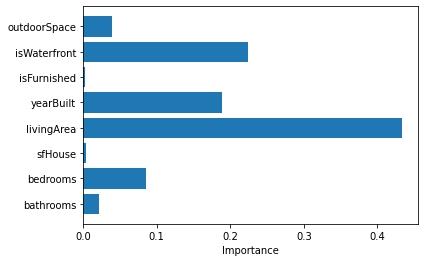

bathrooms 2.19 %
bedrooms 8.51 %
sfHouse 0.41 %
livingArea 43.34 %
yearBuilt 18.87 %
isFurnished 0.26 %
isWaterfront 22.46 %
outdoorSpace 3.96 %


In [25]:
# zillow data model

zdata = pd.read_csv('zillowdatacsv.csv')
zdata['isWaterfront'] = zdata['rf_hasWaterfrontView'].apply(lambda x: 1 if x == True else 0)
zdata['isFurnished'] = zdata['rf_furnished'].apply(lambda x: 1 if x == True else 0)
zdata['sfHouse'] = zdata['homeType'].apply(lambda x: 1 if x == "SINGLE_FAMILY" else 0)
zdata['outdoorSpace'] = zdata['m_hasOutdoorSpace'].apply(lambda x: 1 if x == True else 0)
zdata['zvalue'] = zdata.apply(
    lambda row: min(row['price'], row['zestimate']) if pd.notnull(row['zestimate']) else row['price'], 
    axis=1
)

x = zdata[['bathrooms','bedrooms','sfHouse','livingArea','yearBuilt','isFurnished' ,'isWaterfront','outdoorSpace']]
y = zdata['zvalue']

Xtrain, Xtest, Ytrain, Ytest = train_test_split(x,y,test_size=.25,random_state=1)

#Gradient Boosting Machine (GBM)


bestmodel = None
bestscore = float('inf')
bestparams = []

for n_estimators in [15,20,25,30]:
    for learning_rate in [.01,.05,.1]:
        for max_depth in [3,4,5]:
            for min_samples_split in [6,7,8]:
                
                gbm = GradientBoostingRegressor(n_estimators=n_estimators, learning_rate=learning_rate, max_depth=max_depth, min_samples_split=min_samples_split, random_state=2222)
                gbm.fit(Xtrain,Ytrain)
                gbmpred = gbm.predict(Xtest)
                score = mean_squared_error(Ytest,gbmpred, squared=False)
                if score < bestscore:
                    bestscore = score
                    bestmodel = gbm
                    bestpred = gbmpred
                    bestparams = [n_estimators,learning_rate,max_depth,min_samples_split]

gbmpred = bestpred
gbm = bestmodel
print(bestparams)                   
print('r2',r2_score(Ytest,gbmpred))


fi = gbm.feature_importances_
plt.figure()
plt.barh(x.columns, fi)
plt.xlabel('Importance')
plt.show()
for a,b in zip(x.columns,fi):
    print(a,round(b*100,2),'%')

<Figure size 432x288 with 0 Axes>

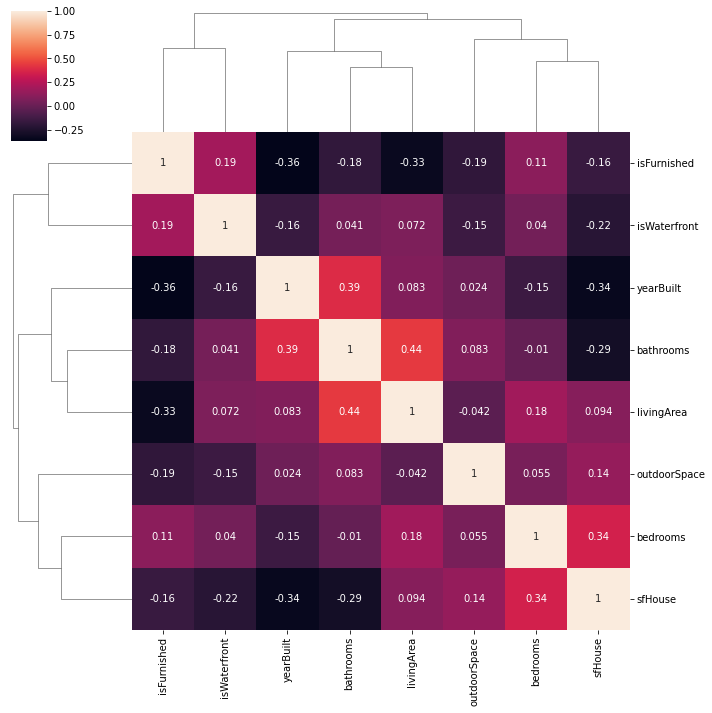

In [26]:
# showing multicollinearity using corr matrix cluster maps
corr = x.corr()
plt.figure()
sns.clustermap(corr,annot=True)

In [11]:
propdata

[{'hasVRModel': True,
  'description': "Discover this classic 4-bedroom, 2-bathroom gem in the heart of Virginia Dare Shores. Offering 1,456 square feet of living space, this home features an open floor plan perfect for comfortable living and entertaining.  Set on a rare 100-foot-wide lot — significantly wider than the typical 50- to 75-foot lots in the area — this property offers a generous side yard, perfect for children, pets, or creating your dream outdoor space.  In addition to the expansive yard, the home boasts a massive workshop, the same size as the house, complete with a full bath. Whether you're a hobbyist, a craftsman, or just need extra space, this workshop offers endless possibilities.  Conveniently located near all the amenities of Kill Devil Hills’ west side, you'll be just minutes from Hayman Street Park, beach access with ample parking, a soundfront gazebo, and a public boat ramp. The Bay Drive multi-use path for biking and walking is also nearby, offering plenty of o